# ASTR 5731 Project 3 Analysis

Alex Granados

In [37]:
#imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from astropy.table import Table
import scipy
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
import arviz as az
import pymc as pm
from scipy import stats
import random

%config InlineBackend.figure_format = 'retina'
az.style.use("arviz-darkgrid")

random.seed(5731)

<>:21: DeprecationWarning: invalid escape sequence \m
<>:22: DeprecationWarning: invalid escape sequence \o
<>:21: DeprecationWarning: invalid escape sequence \m
<>:22: DeprecationWarning: invalid escape sequence \o
<ipython-input-2-b17cc6041855>:21: DeprecationWarning: invalid escape sequence \m
  plt.xlabel('Log(T$_\mathrm{eff}$)')
<ipython-input-2-b17cc6041855>:22: DeprecationWarning: invalid escape sequence \o
  plt.ylabel('Log(L/L$_\odot$)')


Text(0, 0.5, 'Log(L/L$_\\odot$)')

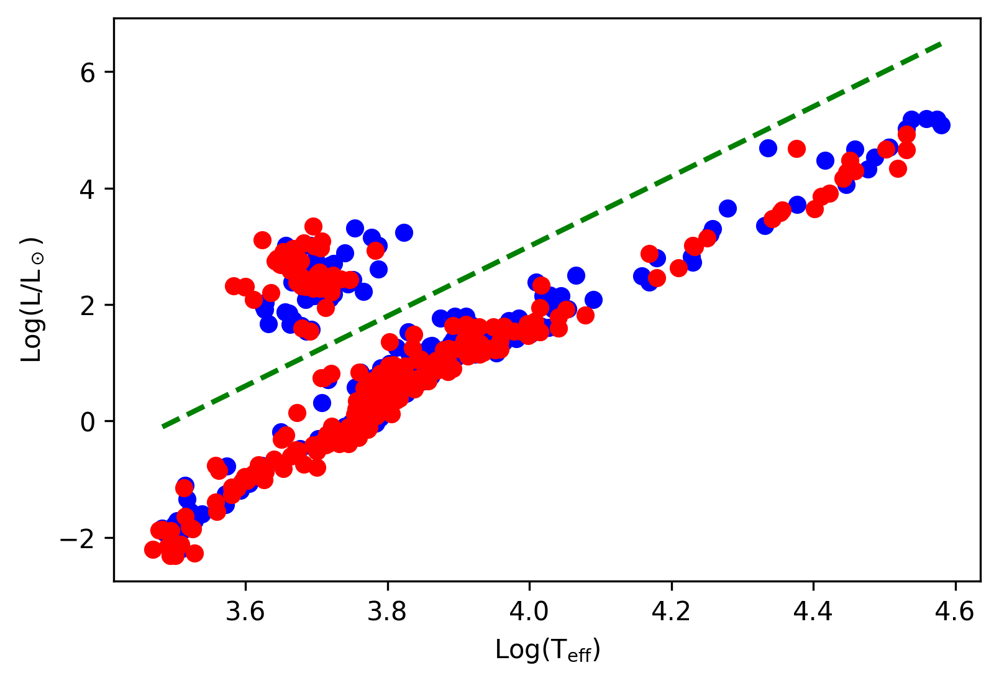

In [2]:

#load in the data
df = Table.read('https://www.astro.keele.ac.uk/jkt/debcat/debs.dat', format='ascii').to_pandas()

#filter out erroneous values
df = df[df['logL1'] > -3]

logT1 = df["logT1"]
logT1 = np.array(logT1)
logL1 = df["logL1"]
logL1 = np.array(logL1)

logT2 = df["logT2"]
logT2 = np.array(logT2)
logL2 = df["logL2"]
logL2 = np.array(logL2)

plt.scatter(logT1, logL1, color='blue')
plt.scatter(logT2, logL2, color='red')
plt.plot(logT1, 6*logT1 -21, color='green', linestyle='--', linewidth=2)
#plt.plot(logT2, 6*logT2 -21, color='orange', linestyle='--', linewidth=2)
plt.xlabel('Log(T$_\mathrm{eff}$)')
plt.ylabel('Log(L/L$_\odot$)')

In [3]:
#make the cut for red giant and main sequence for dataset 1
logR1_ms = df['logR1'][logL1 < (6*logT1-21)]
logR1_rg = df['logR1'][logL1 > (6*logT1-21)]

#make the cut for red giant and main sequence for dataset 2
logR2_ms = df['logR2'][logL1 < (6*logT1-21)]
logR2_rg = df['logR2'][logL1 > (6*logT1-21)]

#filter the errors for dataset 1
logR1_ms_err = df['logR1e'][logL1 < (6*logT1-21)]
logR1_rg_err = df['logR1e'][logL1 > (6*logT1-21)]

#filter the erros for dataset 2
logR2_ms_err = df['logR2e'][logL1 < (6*logT1-21)]
logR2_rg_err = df['logR2e'][logL1 > (6*logT1-21)]

#convert all data to numpy arrays
logR1_ms = np.array(logR1_ms)
logR1_rg = np.array(logR1_rg)
logR2_ms = np.array(logR2_ms)
logR2_rg = np.array(logR2_rg)

#convert all errors to numpy arrays
logR1_ms_err = np.array(logR1_ms_err)
logR1_rg_err = np.array(logR1_rg_err)
logR2_ms_err = np.array(logR2_ms_err)
logR2_rg_err = np.array(logR2_rg_err)

#concatenate all radii data into one array
radii_all = np.concatenate((logR1_ms, logR1_rg, logR2_ms, logR2_rg))

#concatenate all radius error data into one array
radii_all_err = np.concatenate((logR1_ms_err, logR1_rg_err, logR2_ms_err, logR2_rg_err))

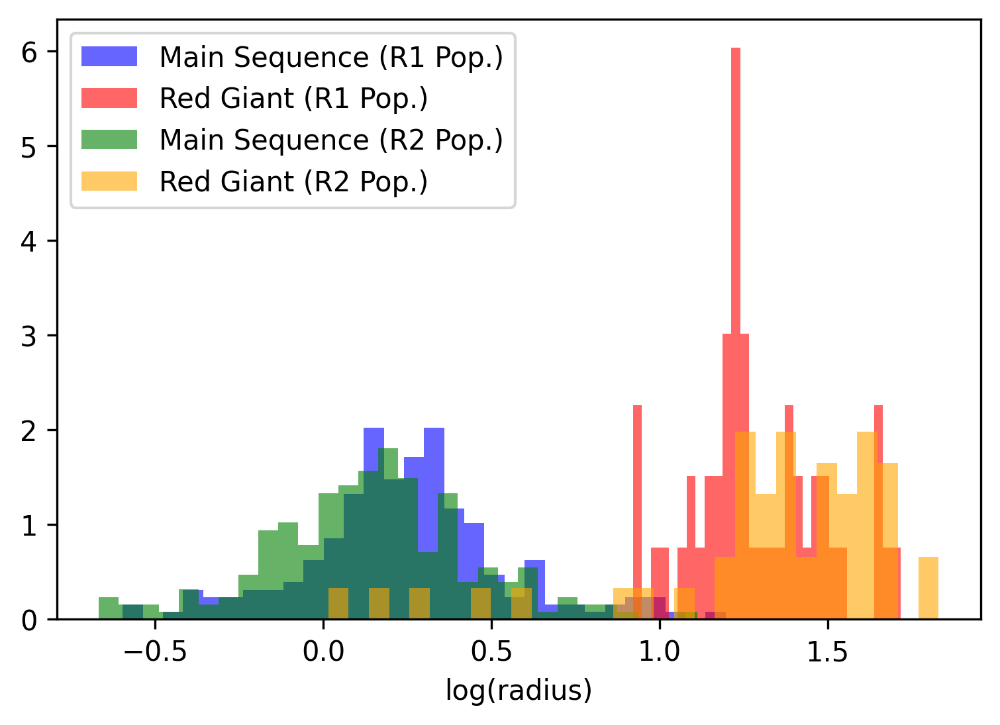

In [4]:
plt.hist(logR1_ms, color='blue', alpha=0.6, density=True, label='Main Sequence (R1 Pop.)', bins=30)
#az.plot_kde(logR1_ms)
plt.hist(logR1_rg, color='red', alpha=0.6, density=True, label='Red Giant (R1 Pop.)', bins=30)
#az.plot_kde(logR1_rg)
plt.hist(logR2_ms, color='green', alpha=0.6, density=True, label='Main Sequence (R2 Pop.)', bins=30)
#az.plot_kde(logR2_ms)
plt.hist(logR2_rg, color='orange', alpha=0.6, density=True, label='Red Giant (R2 Pop.)', bins=30)
#az.plot_kde(logR2_rg)
plt.xlabel('log(radius)')
plt.legend()

/usr/lib/python3/dist-packages/numba/targets/arraymath.py:3670: DeprecationWarning: `np.MachAr` is deprecated (NumPy 1.22).
  @overload(np.MachAr)


Text(0.5, 0, 'log(radius)')

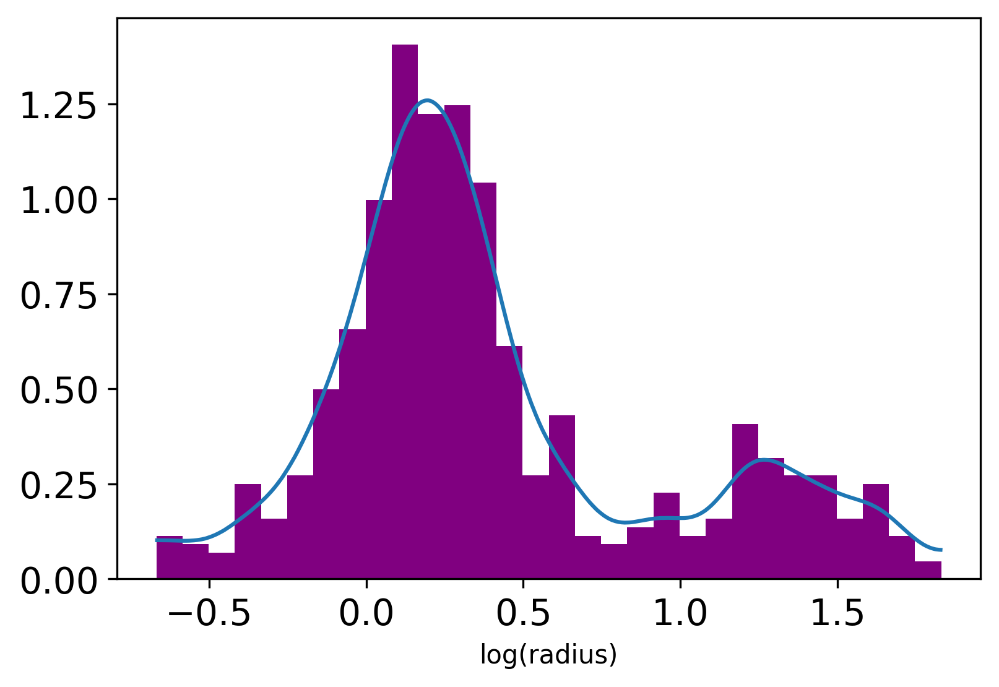

In [5]:
plt.hist(radii_all, color='purple', density=True, bins=30)
az.plot_kde(radii_all)
plt.xlabel('log(radius)')

### Mixture models

Mixture models arise when the overall population is the result of the superposition of distinct sub-populations.

One way to build a mixture model is to consider a finite weighted mixture of two or more distributions. This is known as a **finite mixture model**. The probability density of the observed data is the weighted sum of the probability densityfor *k* soubgroups of the data:

$$ p(y|\theta) = \sum_{i=1}^k w_ip_i(y|\theta_i) $$

where $w_i$ is the probability of the component *i*, so the values of $w_i$ are restricted to [0,1] and $\sum_{i=0}^kw_i = 1$. For finite mixture models, *k* is a finite value. 

How we estimate the parameters $\theta_i$ is we introduce a *latent* random variable $z$, whose function is to specify from which component a particular observation is coming from. This variable is called latent because it is not directly observable.

The bimodality in the distribution is clear, and the data cannot be properly described with a single Gaussian. We probably need two or three components, judging from the shape of the distribution. The solid line in the figure shows the KDE estimate of the probability density function.
 
In the mixture model we have *k* outcomes. The generalized Bernoulli distribution with *k* outcomes is the **categorical** distribution and the generalization of the Beta distribution is the **Dirichlet** distribution.

The ```Dirichlet``` distribution is defined in the n-dimensional [simplex](https://en.wikipedia.org/wiki/Simplex), basically an n-dimensional triangle. 
The output of this distribution is an n-dimensional vector, whose elements are restricted to be $\ge 0$, and sum up to 1.

A flat prior distribution on the simplex is obtained for $a=1$. Larger values of *a* result in more informative priors. 

To model the star radii distribution we will assume $k=2, 3, 4$. The statistical model is:

$$ y | z_i = k \sim N(\mu_k,\tau)$$
$$ \mu_k \stackrel{iid}{\sim} N_k(a,b)$$
$$ \tau \sim \text Gamma(c,d) $$
$$ w\sim \text Dir(\alpha) $$
$$ z_i|w_k \sim Cat(w)$$

where we are starting with reference priors of $b=.001, c=d=0.05$, and it can be implemented in PyMC3 as follows:

*(texted copied from Mixture Models Notebook shared by Claudia)*

**For k=3**

In [6]:
k=3
b=1e-3
c=0.5
d=0.5

with pm.Model() as mixture3:
    w = pm.Dirichlet('w', a=np.ones(k))
    means = pm.Normal('means1', mu=[0., 1, 2], tau=b, shape=(k,))
    tau = pm.Gamma('tau', alpha=c, beta=d, shape=(k,))
    components = pm.Normal.dist(mu=means, tau=tau, shape=(k,))
    
    y = pm.Mixture('y', w=w, comp_dists=components, observed=radii_all)
    
    trace_k3 = pm.sample(5000, chains=2, cores=4, init='jitter+adapt_diag', return_inferencedata=True)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [w, means1, tau]


Sampling 2 chains for 1_000 tune and 5_000 draw iterations (2_000 + 10_000 draws total) took 28 seconds.


array([[<AxesSubplot:title={'center':'means1'}>,
        <AxesSubplot:title={'center':'means1'}>],
       [<AxesSubplot:title={'center':'w'}>,
        <AxesSubplot:title={'center':'w'}>],
       [<AxesSubplot:title={'center':'tau'}>,
        <AxesSubplot:title={'center':'tau'}>]], dtype=object)

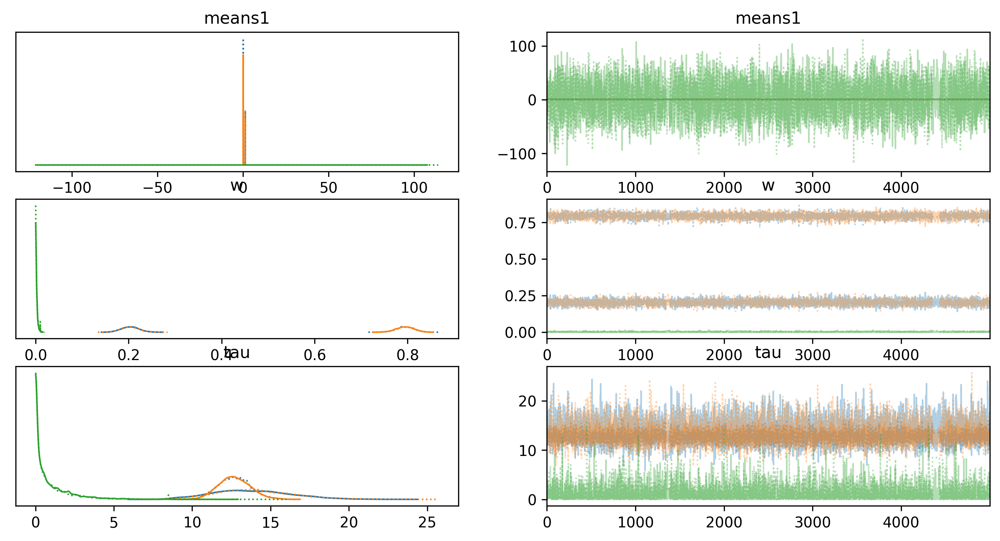

In [7]:
az.plot_trace(trace_k3)

In [8]:
az.summary(trace_k3)

/usr/lib/python3/dist-packages/numba/ir_utils.py:1512: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if (hasattr(numpy, value)
/usr/lib/python3/dist-packages/numba/ir_utils.py:1513: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  and def_val == getattr(numpy, value)):
/usr/lib/python3/dist-packages/numba/ir_utils.py:1512: DeprecationWarning

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
means1[0],0.740,0.568,0.146,1.350,0.401,0.339,3.0,44.0,1.83
means1[1],0.740,0.567,0.147,1.351,0.400,0.339,3.0,43.0,1.83
means1[2],2.396,30.142,-53.914,61.200,0.368,0.317,6650.0,6856.0,1.00
w[0],0.499,0.296,0.174,0.823,0.209,0.177,3.0,47.0,1.83
w[1],0.499,0.296,0.176,0.825,0.209,0.177,3.0,42.0,1.83
w[2],0.002,0.002,0.000,0.006,0.000,0.000,1902.0,558.0,1.00
tau[0],13.234,2.035,9.883,17.750,0.381,0.313,61.0,61.0,1.13
tau[1],13.276,1.983,9.749,17.408,0.420,0.329,34.0,45.0,1.12
tau[2],1.079,1.557,0.000,3.694,0.061,0.056,1971.0,736.0,1.00


In [9]:
trace_k3

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

array([[<AxesSubplot:title={'center':'w\n0'}>,
        <AxesSubplot:title={'center':'w\n0'}>],
       [<AxesSubplot:title={'center':'w\n1'}>,
        <AxesSubplot:title={'center':'w\n1'}>],
       [<AxesSubplot:title={'center':'w\n2'}>,
        <AxesSubplot:title={'center':'w\n2'}>]], dtype=object)

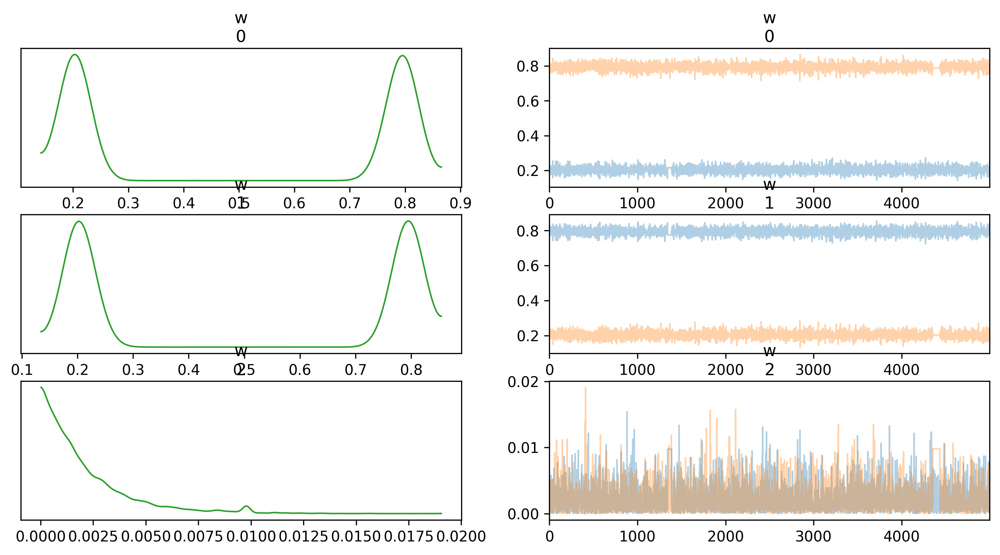

In [10]:
az.plot_trace(trace_k3, ['w'], combined=True, compact=False)

array([[<AxesSubplot:title={'center':'means1\n0'}>,
        <AxesSubplot:title={'center':'means1\n0'}>],
       [<AxesSubplot:title={'center':'means1\n1'}>,
        <AxesSubplot:title={'center':'means1\n1'}>],
       [<AxesSubplot:title={'center':'means1\n2'}>,
        <AxesSubplot:title={'center':'means1\n2'}>]], dtype=object)

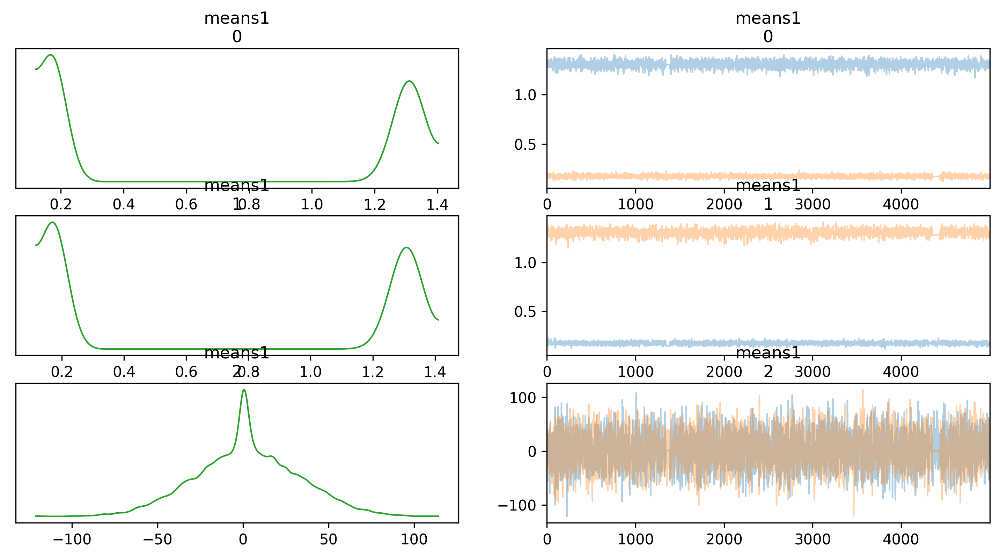

In [11]:
az.plot_trace(trace_k3, ['means1'], combined=True, compact=False)

In [12]:
trace_k3.posterior['means1'].stack(draws=('chain', 'draw')).to_numpy().mean(1)
print(len(trace_k3.posterior['means1'].to_numpy()))

2


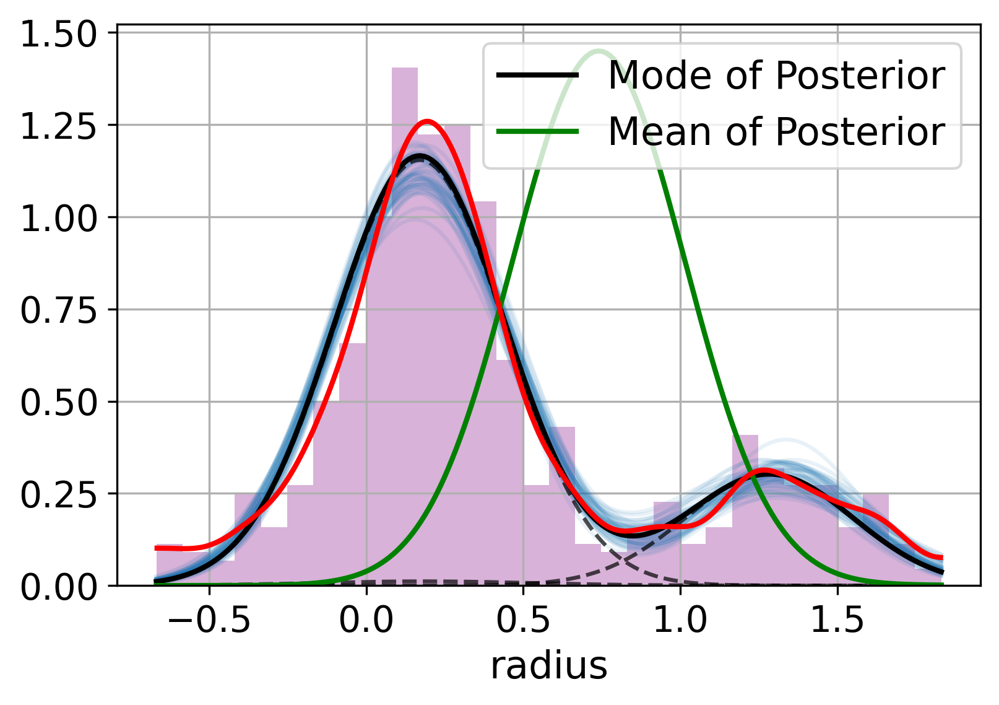

In [13]:
#plotting them all together

x = np.linspace(radii_all.min(), radii_all.max(), 200)

x_ = np.array([x]*3).T

for i in range(50):
    i_ = np.random.randint(0,5000)
    means_y = trace_k3.posterior['means1'].stack(draws=('chain', 'draw')).to_numpy()[:,i_]
    w_y = trace_k3.posterior['w'].stack(draws=("chain", "draw")).to_numpy()[:,i_]
    tau_y = trace_k3.posterior['tau'].stack(draws=("chain", "draw")).to_numpy()[:,i_]
    dist = stats.norm(means_y,1/np.sqrt(tau_y))
    plt.plot(x,np.sum(dist.pdf(x_)*w_y,1),'C0',alpha=0.1)

med_y = stats.mode(trace_k3.posterior['means1'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()
medw_y = stats.mode(trace_k3.posterior['w'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()
medt_y = stats.mode(trace_k3.posterior['tau'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()

dist = stats.norm(med_y,1/np.sqrt(medt_y))
plt.plot(x,np.sum(dist.pdf(x_)*medw_y,1),'k',lw=2,label='Mode of Posterior')
plt.plot(x,dist.pdf(x_)*medw_y,'k--',alpha=0.7)

means_y = trace_k3.posterior['means1'].stack(draws=('chain', "draw")).to_numpy().mean(1)
w_y = trace_k3.posterior['w'].stack(draws=('chain', "draw")).to_numpy().mean(1)
tau_y = trace_k3.posterior['tau'].stack(draws=('chain', "draw")).to_numpy().mean(1)
dist = stats.norm(means_y, 1/np.sqrt(tau_y))
plt.plot(x, np.sum(dist.pdf(x_)*w_y,1), 'g', lw=2, label='Mean of Posterior')

az.plot_kde(radii_all, plot_kwargs={'linewidth':2, 'color':'r'})
plt.hist(radii_all, bins=30, density=True, alpha=0.3, color='purple')

plt.xlabel('radius', fontsize=15)
plt.grid()
plt.legend(fontsize=15)

There were really only contributions from 2 out of the 3 mixture models, even tho there are very tiny bumps visible in observed data that may lead one to believe there would be more then 2 mixtures.

**For k=2**

In [14]:
k=2
b=1e-3
c=0.5
d=0.5

with pm.Model() as mixture2:
    w = pm.Dirichlet('w', a=np.ones(k))
    means = pm.Normal('means1', mu=[0., 1], tau=b, shape=(k,))
    tau = pm.Gamma('tau', alpha=c, beta=d, shape=(k,))
    components = pm.Normal.dist(mu=means, tau=tau, shape=(k,))
    
    y = pm.Mixture('y', w=w, comp_dists=components, observed=radii_all)
    
    trace_k2 = pm.sample(5000, chains=2, cores=4, init='jitter+adapt_diag', return_inferencedata=True)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [w, means1, tau]


Sampling 2 chains for 1_000 tune and 5_000 draw iterations (2_000 + 10_000 draws total) took 6 seconds.


array([[<AxesSubplot:title={'center':'means1'}>,
        <AxesSubplot:title={'center':'means1'}>],
       [<AxesSubplot:title={'center':'w'}>,
        <AxesSubplot:title={'center':'w'}>],
       [<AxesSubplot:title={'center':'tau'}>,
        <AxesSubplot:title={'center':'tau'}>]], dtype=object)

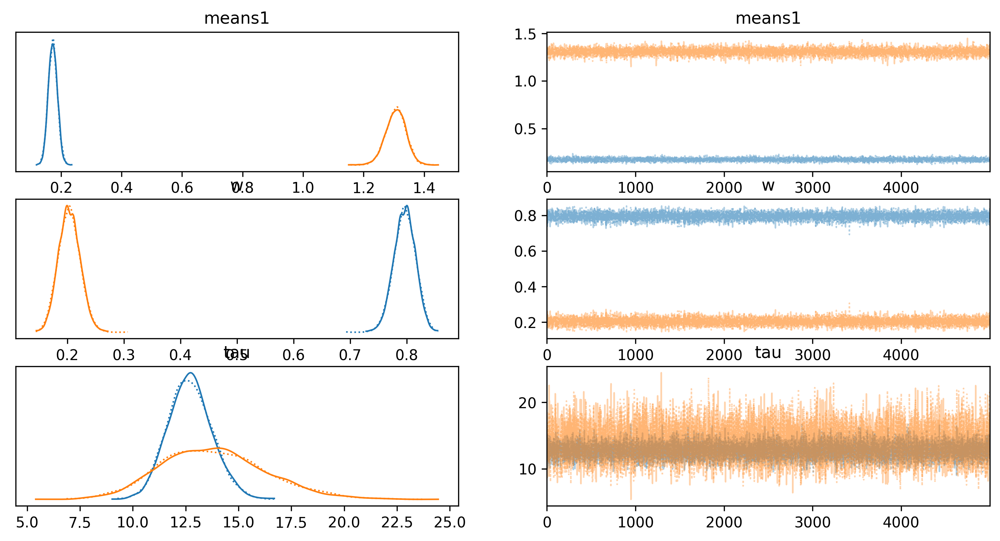

In [15]:
az.plot_trace(trace_k2)

In [16]:
az.summary(trace_k2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
means1[0],0.173,0.015,0.145,0.201,0.000,0.000,8939.0,7689.0,1.0
means1[1],1.306,0.033,1.246,1.370,0.000,0.000,7336.0,6351.0,1.0
w[0],0.796,0.019,0.761,0.833,0.000,0.000,9726.0,8019.0,1.0
w[1],0.204,0.019,0.167,0.239,0.000,0.000,9726.0,8019.0,1.0
tau[0],12.711,1.047,10.803,14.729,0.011,0.008,8705.0,7499.0,1.0
tau[1],13.832,2.486,9.298,18.550,0.029,0.021,7110.0,7163.0,1.0


array([[<AxesSubplot:title={'center':'w\n0'}>,
        <AxesSubplot:title={'center':'w\n0'}>],
       [<AxesSubplot:title={'center':'w\n1'}>,
        <AxesSubplot:title={'center':'w\n1'}>]], dtype=object)

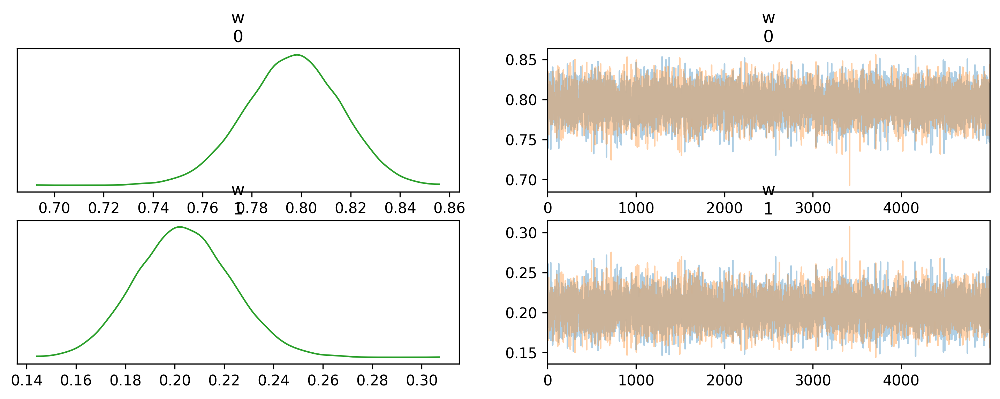

In [17]:
az.plot_trace(trace_k2, ['w'], combined=True, compact=False)

array([[<AxesSubplot:title={'center':'means1\n0'}>,
        <AxesSubplot:title={'center':'means1\n0'}>],
       [<AxesSubplot:title={'center':'means1\n1'}>,
        <AxesSubplot:title={'center':'means1\n1'}>]], dtype=object)

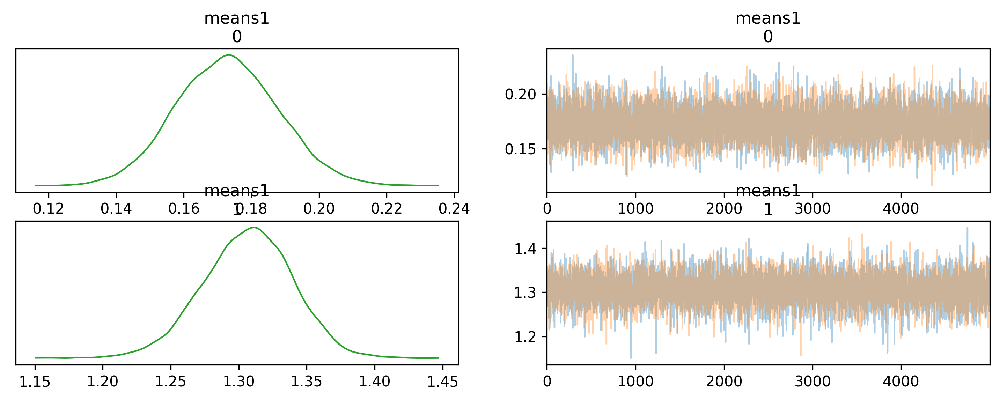

In [18]:
az.plot_trace(trace_k2, ['means1'], combined=True, compact=False)

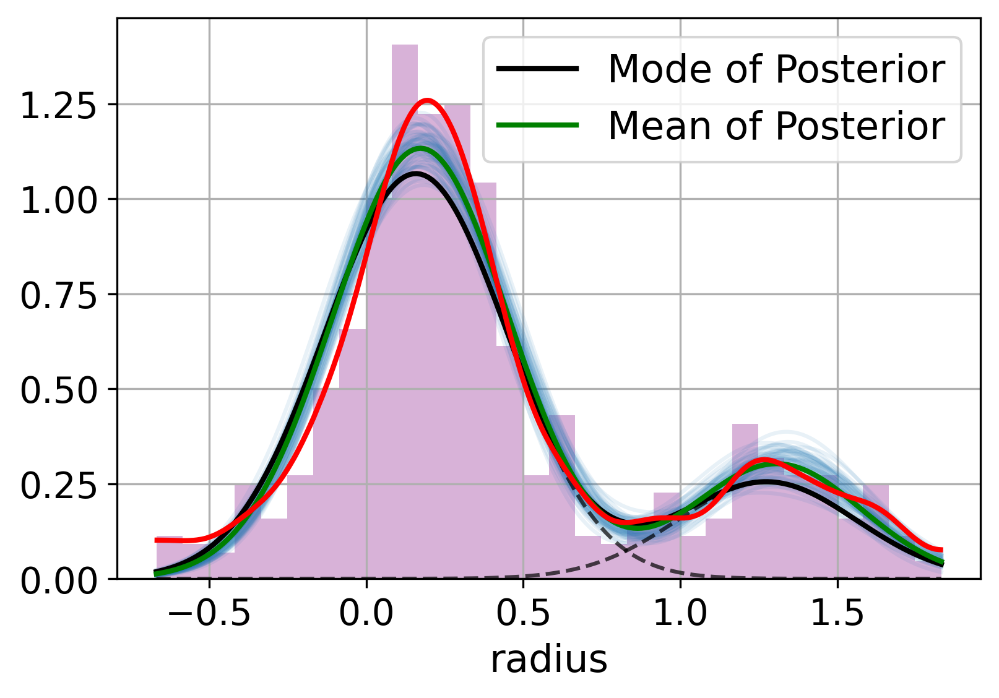

In [30]:
#plotting them all together

x = np.linspace(radii_all.min(), radii_all.max(), 200)

x_ = np.array([x]*2).T

for i in range(50):
    i_ = np.random.randint(0,5000)
    means_y = trace_k2.posterior['means1'].stack(draws=('chain', 'draw')).to_numpy()[:,i_]
    w_y = trace_k2.posterior['w'].stack(draws=("chain", "draw")).to_numpy()[:,i_]
    tau_y = trace_k2.posterior['tau'].stack(draws=("chain", "draw")).to_numpy()[:,i_]
    dist = stats.norm(means_y,1/np.sqrt(tau_y))
    plt.plot(x,np.sum(dist.pdf(x_)*w_y,1),'C0',alpha=0.1)

med_y = stats.mode(trace_k2.posterior['means1'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()
medw_y = stats.mode(trace_k2.posterior['w'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()
medt_y = stats.mode(trace_k2.posterior['tau'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()

dist = stats.norm(med_y,1/np.sqrt(medt_y))
plt.plot(x,np.sum(dist.pdf(x_)*medw_y,1),'k',lw=2,label='Mode of Posterior')
plt.plot(x,dist.pdf(x_)*medw_y,'k--',alpha=0.7)

means_y = trace_k2.posterior['means1'].stack(draws=('chain', "draw")).to_numpy().mean(1)
w_y = trace_k2.posterior['w'].stack(draws=('chain', "draw")).to_numpy().mean(1)
tau_y = trace_k2.posterior['tau'].stack(draws=('chain', "draw")).to_numpy().mean(1)
dist = stats.norm(means_y, 1/np.sqrt(tau_y))
plt.plot(x, np.sum(dist.pdf(x_)*w_y,1), 'g', lw=2, label='Mean of Posterior')

#plt.plot(x,dist.pdf(x_)*medw_y,'k--',alpha=0.7)

az.plot_kde(radii_all, plot_kwargs={'linewidth':2, 'color':'r'})
plt.hist(radii_all, bins=30, density=True, alpha=0.3, color='purple')

plt.xlabel('radius', fontsize=15)
plt.grid()
plt.legend(fontsize=15)

This is pretty good! Doesn't follow the fine detail in the bumps, but they are within the ppc lines

**For k=4**

In [20]:
k=4
b=1e-3
c=0.5
d=0.5

with pm.Model() as mixture4:
    w = pm.Dirichlet('w', a=np.ones(k))
    means = pm.Normal('means1', mu=[0., 1, 2, 3], tau=b, shape=(k,))
    tau = pm.Gamma('tau', alpha=c, beta=d, shape=(k,))
    components = pm.Normal.dist(mu=means, tau=tau, shape=(k,))
    
    y = pm.Mixture('y', w=w, comp_dists=components, observed=radii_all)
    
    trace_k4 = pm.sample(5000, chains=2, cores=4, init='jitter+adapt_diag', return_inferencedata=True)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [w, means1, tau]


Sampling 2 chains for 1_000 tune and 5_000 draw iterations (2_000 + 10_000 draws total) took 157 seconds.


array([[<AxesSubplot:title={'center':'means1'}>,
        <AxesSubplot:title={'center':'means1'}>],
       [<AxesSubplot:title={'center':'w'}>,
        <AxesSubplot:title={'center':'w'}>],
       [<AxesSubplot:title={'center':'tau'}>,
        <AxesSubplot:title={'center':'tau'}>]], dtype=object)

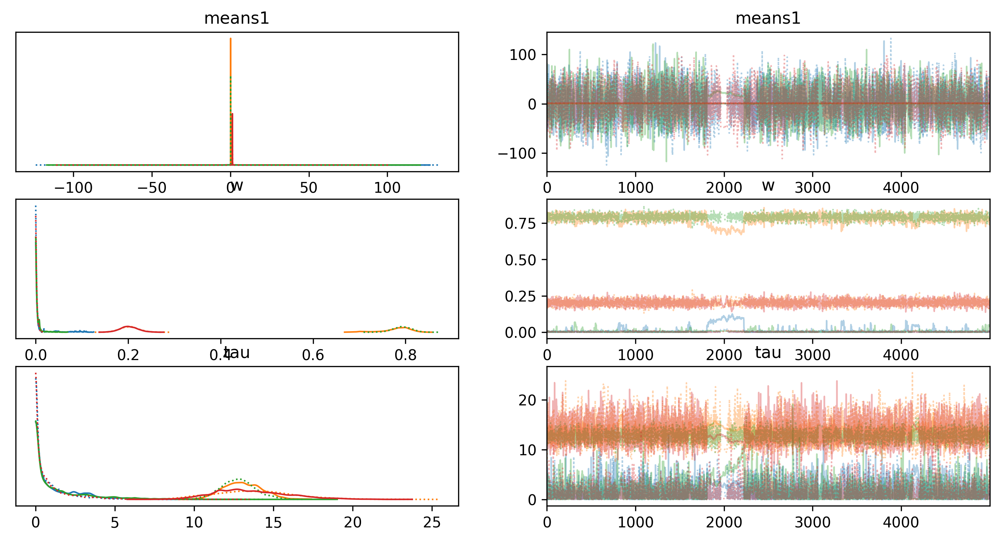

In [21]:
az.plot_trace(trace_k4)

In [22]:
az.summary(trace_k4)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
means1[0],-0.518,28.931,-60.141,53.844,0.500,0.512,3330.0,3494.0,1.02
means1[1],0.740,0.567,0.147,1.351,0.400,0.339,3.0,46.0,1.83
means1[2],1.602,20.136,-44.427,46.380,0.498,4.253,652.0,44.0,1.81
means1[3],1.309,20.880,-48.194,44.302,0.377,4.800,2766.0,43.0,1.82
w[0],0.008,0.020,0.000,0.043,0.004,0.003,99.0,24.0,1.03
w[1],0.492,0.290,0.173,0.820,0.204,0.173,3.0,47.0,1.83
w[2],0.399,0.394,0.000,0.816,0.278,0.236,3.0,47.0,1.83
w[3],0.102,0.101,0.000,0.225,0.071,0.060,3.0,49.0,1.83
tau[0],1.233,1.563,0.000,4.094,0.096,0.068,393.0,751.0,1.01
tau[1],13.408,2.062,9.661,17.541,0.153,0.173,445.0,53.0,1.10


array([[<AxesSubplot:title={'center':'w\n0'}>,
        <AxesSubplot:title={'center':'w\n0'}>],
       [<AxesSubplot:title={'center':'w\n1'}>,
        <AxesSubplot:title={'center':'w\n1'}>],
       [<AxesSubplot:title={'center':'w\n2'}>,
        <AxesSubplot:title={'center':'w\n2'}>],
       [<AxesSubplot:title={'center':'w\n3'}>,
        <AxesSubplot:title={'center':'w\n3'}>]], dtype=object)

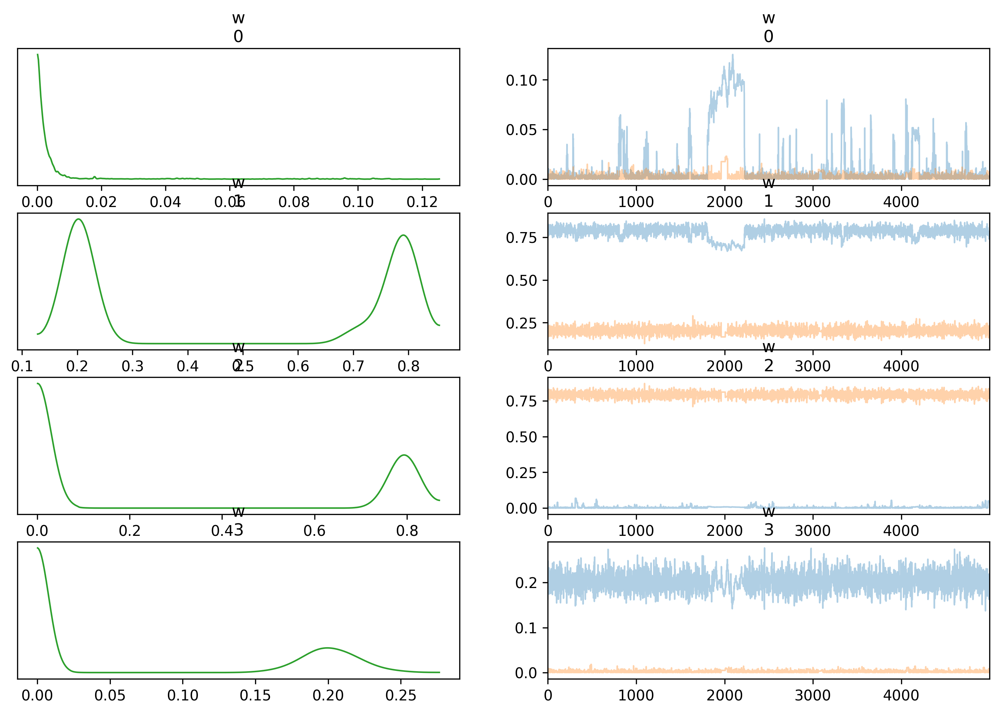

In [23]:
az.plot_trace(trace_k4, ['w'], combined=True, compact=False)

array([[<AxesSubplot:title={'center':'means1\n0'}>,
        <AxesSubplot:title={'center':'means1\n0'}>],
       [<AxesSubplot:title={'center':'means1\n1'}>,
        <AxesSubplot:title={'center':'means1\n1'}>],
       [<AxesSubplot:title={'center':'means1\n2'}>,
        <AxesSubplot:title={'center':'means1\n2'}>],
       [<AxesSubplot:title={'center':'means1\n3'}>,
        <AxesSubplot:title={'center':'means1\n3'}>]], dtype=object)

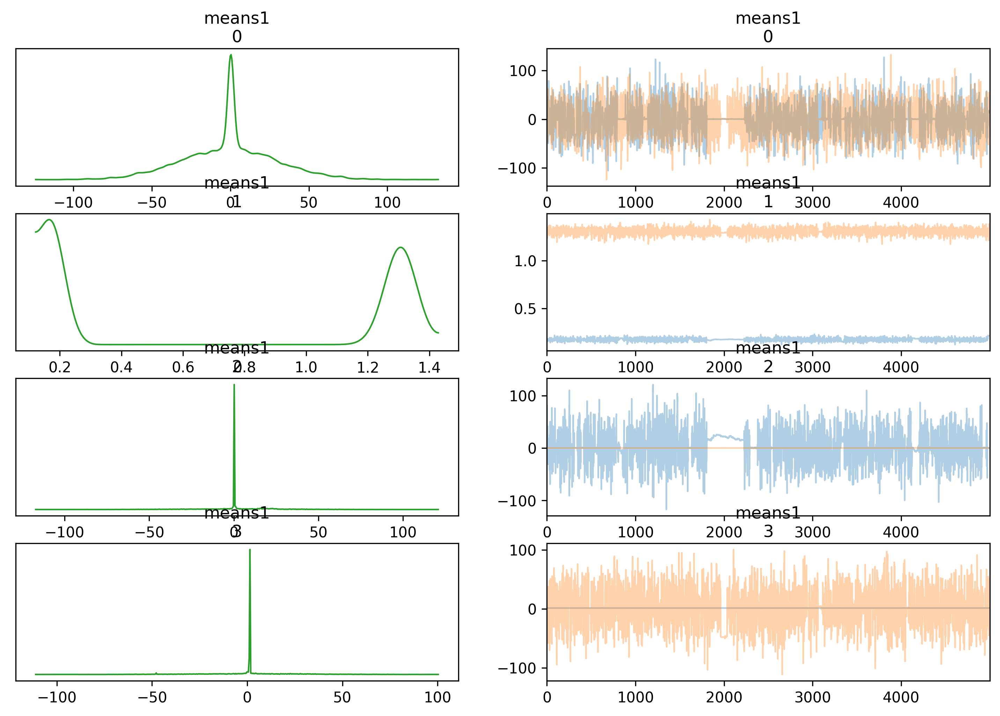

In [24]:
az.plot_trace(trace_k4, ['means1'], combined=True, compact=False)

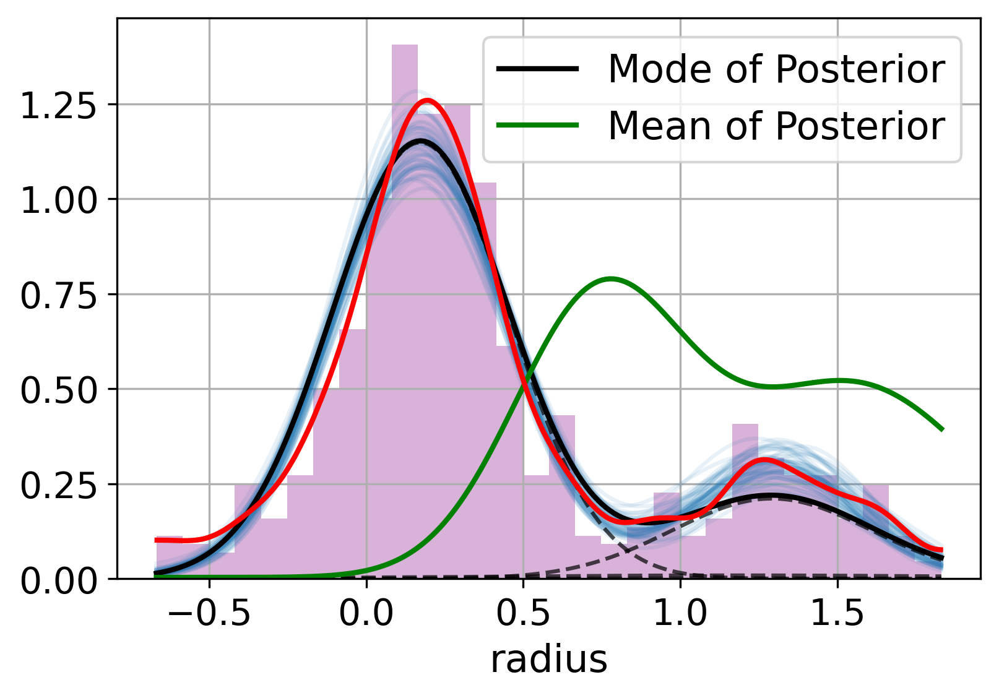

In [25]:
#plotting them all together

x = np.linspace(radii_all.min(), radii_all.max(), 200)

x_ = np.array([x]*k).T

for i in range(50):
    i_ = np.random.randint(0,5000)
    means_y = trace_k4.posterior['means1'].stack(draws=('chain', 'draw')).to_numpy()[:,i_]
    w_y = trace_k4.posterior['w'].stack(draws=("chain", "draw")).to_numpy()[:,i_]
    tau_y = trace_k4.posterior['tau'].stack(draws=("chain", "draw")).to_numpy()[:,i_]
    dist = stats.norm(means_y,1/np.sqrt(tau_y))
    plt.plot(x,np.sum(dist.pdf(x_)*w_y,1),'C0',alpha=0.1)

med_y = stats.mode(trace_k4.posterior['means1'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()
medw_y = stats.mode(trace_k4.posterior['w'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()
medt_y = stats.mode(trace_k4.posterior['tau'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()

dist = stats.norm(med_y,1/np.sqrt(medt_y))
plt.plot(x,np.sum(dist.pdf(x_)*medw_y,1),'k',lw=2,label='Mode of Posterior')
plt.plot(x,dist.pdf(x_)*medw_y,'k--',alpha=0.7)

means_y = trace_k4.posterior['means1'].stack(draws=('chain', "draw")).to_numpy().mean(1)
w_y = trace_k4.posterior['w'].stack(draws=('chain', "draw")).to_numpy().mean(1)
tau_y = trace_k4.posterior['tau'].stack(draws=('chain', "draw")).to_numpy().mean(1)
dist = stats.norm(means_y, 1/np.sqrt(tau_y))
plt.plot(x, np.sum(dist.pdf(x_)*w_y,1), 'g', lw=2, label='Mean of Posterior')

#plt.plot(x,dist.pdf(x_)*medw_y,'k--',alpha=0.7)

az.plot_kde(radii_all, plot_kwargs={'linewidth':2, 'color':'r'})
plt.hist(radii_all, bins=30, density=True, alpha=0.3, color='purple')

plt.xlabel('radius', fontsize=15)
plt.grid()
plt.legend(fontsize=15)

worse then k=2 and k=3

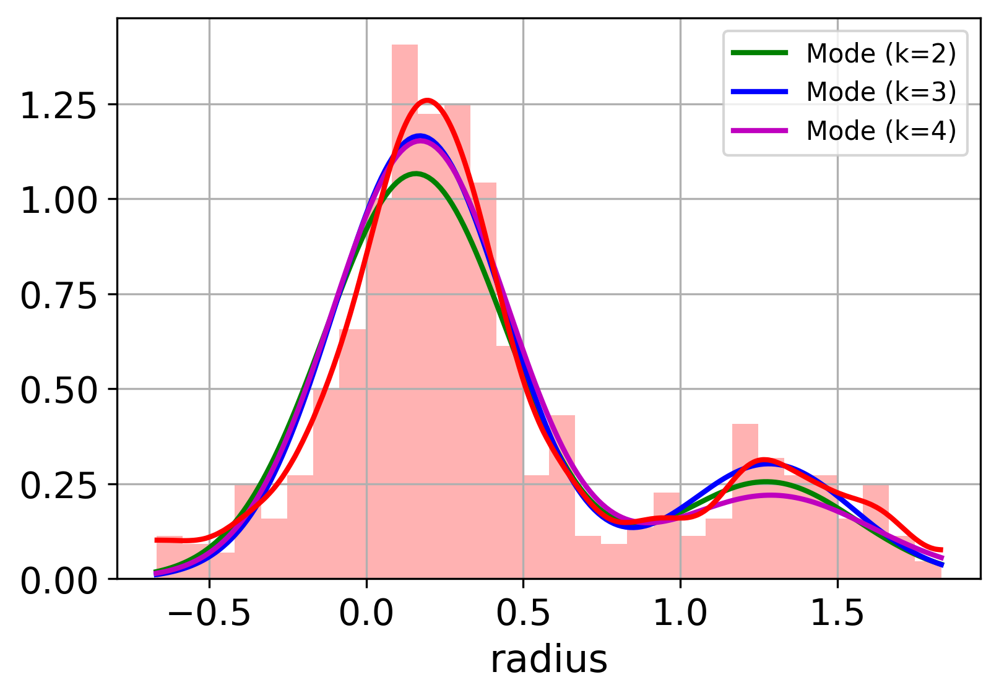

In [26]:
#plotting all k's, modes
#k=2
x = np.linspace(radii_all.min(), radii_all.max(), 200)

x_ = np.array([x]*2).T

med_y = stats.mode(trace_k2.posterior['means1'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()
medw_y = stats.mode(trace_k2.posterior['w'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()
medt_y = stats.mode(trace_k2.posterior['tau'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()

dist = stats.norm(med_y,1/np.sqrt(medt_y))
plt.plot(x,np.sum(dist.pdf(x_)*medw_y,1),'g',lw=2,label='Mode (k=2)')
#plt.plot(x,dist.pdf(x_)*medw_y,'k--',alpha=0.7)


#k=3
x = np.linspace(radii_all.min(), radii_all.max(), 200)

x_ = np.array([x]*3).T

med_y = stats.mode(trace_k3.posterior['means1'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()
medw_y = stats.mode(trace_k3.posterior['w'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()
medt_y = stats.mode(trace_k3.posterior['tau'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()

dist = stats.norm(med_y,1/np.sqrt(medt_y))
plt.plot(x,np.sum(dist.pdf(x_)*medw_y,1),'b',lw=2,label='Mode (k=3)')
#plt.plot(x,dist.pdf(x_)*medw_y,'k--',alpha=0.7)

#k=4
x = np.linspace(radii_all.min(), radii_all.max(), 200)

x_ = np.array([x]*4).T

med_y = stats.mode(trace_k4.posterior['means1'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()
medw_y = stats.mode(trace_k4.posterior['w'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()
medt_y = stats.mode(trace_k4.posterior['tau'].stack(draws=("chain", "draw")).to_numpy(),axis=1,keepdims=True)[0].flatten()

dist = stats.norm(med_y,1/np.sqrt(medt_y))
plt.plot(x,np.sum(dist.pdf(x_)*medw_y,1),'m',lw=2,label='Mode (k=4)')
#plt.plot(x,dist.pdf(x_)*medw_y,'k--',alpha=0.7)


#plt.plot(x,dist.pdf(x_)*medw_y,'k--',alpha=0.7)

az.plot_kde(radii_all, plot_kwargs={'linewidth':2, 'color':'r'})
plt.hist(radii_all, bins=30, density=True, alpha=0.3, color='red')

plt.xlabel('radius', fontsize=15)
plt.grid()
plt.legend(fontsize=10)

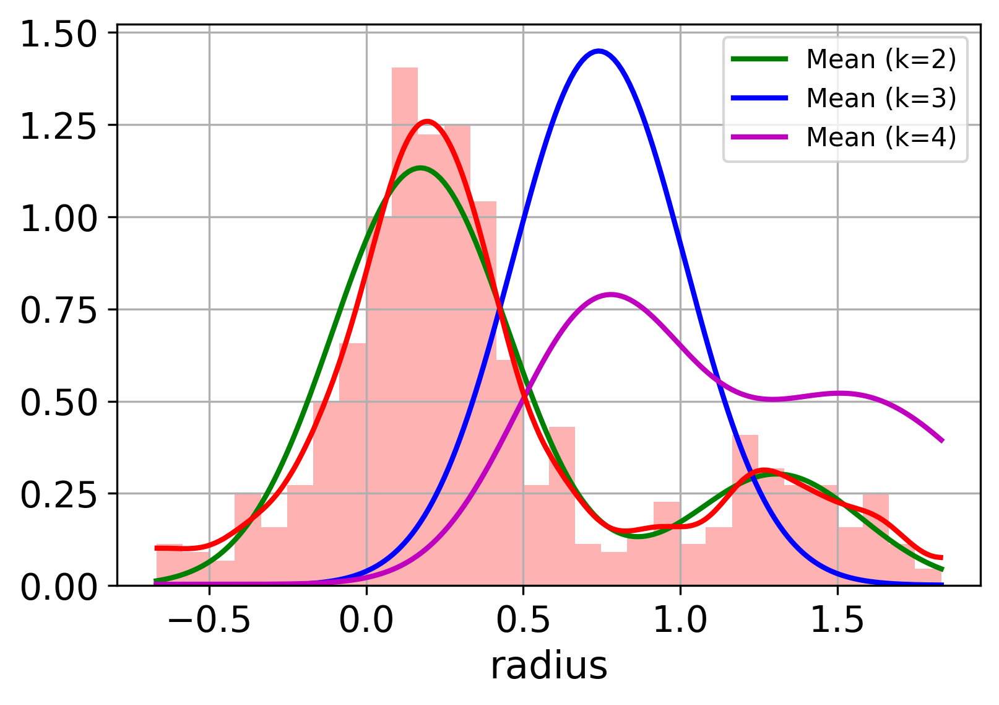

In [27]:
#plotting all k's, means
#k=2
x = np.linspace(radii_all.min(), radii_all.max(), 200)

x_ = np.array([x]*2).T

means_y = trace_k2.posterior['means1'].stack(draws=('chain', "draw")).to_numpy().mean(1)
w_y = trace_k2.posterior['w'].stack(draws=('chain', "draw")).to_numpy().mean(1)
tau_y = trace_k2.posterior['tau'].stack(draws=('chain', "draw")).to_numpy().mean(1)
dist = stats.norm(means_y, 1/np.sqrt(tau_y))
plt.plot(x, np.sum(dist.pdf(x_)*w_y,1), 'g', lw=2, label='Mean (k=2)')


#k=3
x = np.linspace(radii_all.min(), radii_all.max(), 200)

x_ = np.array([x]*3).T

means_y = trace_k3.posterior['means1'].stack(draws=('chain', "draw")).to_numpy().mean(1)
w_y = trace_k3.posterior['w'].stack(draws=('chain', "draw")).to_numpy().mean(1)
tau_y = trace_k3.posterior['tau'].stack(draws=('chain', "draw")).to_numpy().mean(1)
dist = stats.norm(means_y, 1/np.sqrt(tau_y))
plt.plot(x, np.sum(dist.pdf(x_)*w_y,1), 'b', lw=2, label='Mean (k=3)')

#k=4
x = np.linspace(radii_all.min(), radii_all.max(), 200)

x_ = np.array([x]*4).T

means_y = trace_k4.posterior['means1'].stack(draws=('chain', "draw")).to_numpy().mean(1)
w_y = trace_k4.posterior['w'].stack(draws=('chain', "draw")).to_numpy().mean(1)
tau_y = trace_k4.posterior['tau'].stack(draws=('chain', "draw")).to_numpy().mean(1)
dist = stats.norm(means_y, 1/np.sqrt(tau_y))
plt.plot(x, np.sum(dist.pdf(x_)*w_y,1), 'm', lw=2, label='Mean (k=4)')


#plt.plot(x,dist.pdf(x_)*medw_y,'k--',alpha=0.7)

az.plot_kde(radii_all, plot_kwargs={'linewidth':2, 'color':'r'})
plt.hist(radii_all, bins=30, density=True, alpha=0.3, color='red')

plt.xlabel('radius', fontsize=15)
plt.grid()
plt.legend(fontsize=10)

## Sensitivity Analysis

In [31]:
#original analysis for k=2

k=2
mu=[0., 1]
b=1e-3
c=0.5
d=0.5

# with pm.Model() as mixture2:
#     w = pm.Dirichlet('w', a=np.ones(k))
#     means = pm.Normal('means1', mu=[0., 1], tau=b, shape=(k,))
#     tau = pm.Gamma('tau', alpha=c, beta=d, shape=(k,))
#     components = pm.Normal.dist(mu=means, tau=tau, shape=(k,))
    
#     y = pm.Mixture('y', w=w, comp_dists=components, observed=radii_all)
    
#     trace_k2 = pm.sample(5000, chains=2, cores=4, init='jitter+adapt_diag', return_inferencedata=True)

az.summary(trace_k2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
means1[0],0.173,0.015,0.145,0.201,0.000,0.000,8939.0,7689.0,1.0
means1[1],1.306,0.033,1.246,1.370,0.000,0.000,7336.0,6351.0,1.0
w[0],0.796,0.019,0.761,0.833,0.000,0.000,9726.0,8019.0,1.0
w[1],0.204,0.019,0.167,0.239,0.000,0.000,9726.0,8019.0,1.0
tau[0],12.711,1.047,10.803,14.729,0.011,0.008,8705.0,7499.0,1.0
tau[1],13.832,2.486,9.298,18.550,0.029,0.021,7110.0,7163.0,1.0


array([[<AxesSubplot:title={'center':'means1\n0'}>,
        <AxesSubplot:title={'center':'means1\n1'}>,
        <AxesSubplot:title={'center':'w\n0'}>],
       [<AxesSubplot:title={'center':'w\n1'}>,
        <AxesSubplot:title={'center':'tau\n0'}>,
        <AxesSubplot:title={'center':'tau\n1'}>]], dtype=object)

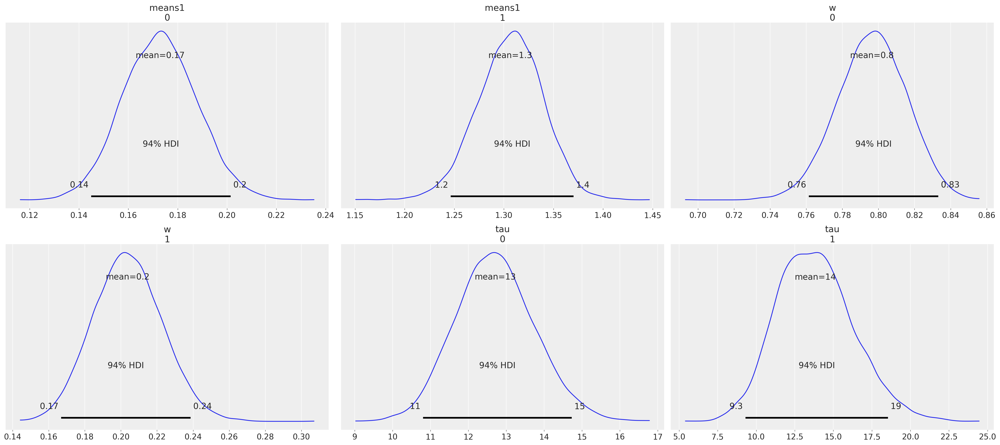

In [40]:
posterior_k2 = trace_k2.posterior
az.plot_posterior(trace_k2)

In [39]:
#prior set 1, changing the mu's
k=2
mu=[0., 1]
b=1e-3
c=0.5
d=0.5

with pm.Model() as mixture2_set1:
    w = pm.Dirichlet('w', a=np.ones(k))
    means = pm.Normal('means1', mu=mu, tau=b, shape=(k,))
    tau = pm.Gamma('tau', alpha=c, beta=d, shape=(k,))
    components = pm.Normal.dist(mu=means, tau=tau, shape=(k,))
    
    y = pm.Mixture('y', w=w, comp_dists=components, observed=radii_all)
    
    trace_k2_set1 = pm.sample(5000, chains=2, cores=4, init='jitter+adapt_diag', return_inferencedata=True)

az.summary(trace_k2_set1)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
means1[0],0.740,0.567,0.145,1.350,0.400,0.339,3.0,41.0,1.83
means1[1],0.740,0.567,0.147,1.352,0.400,0.339,3.0,42.0,1.83
w[0],0.500,0.297,0.176,0.826,0.209,0.177,3.0,43.0,1.83
w[1],0.500,0.297,0.174,0.824,0.209,0.177,3.0,43.0,1.83
tau[0],13.239,1.980,9.693,17.298,0.396,0.315,41.0,46.0,1.12
tau[1],13.270,1.974,9.841,17.324,0.388,0.306,45.0,46.0,1.13


array([[<AxesSubplot:title={'center':'means1\n0'}>,
        <AxesSubplot:title={'center':'means1\n1'}>,
        <AxesSubplot:title={'center':'w\n0'}>],
       [<AxesSubplot:title={'center':'w\n1'}>,
        <AxesSubplot:title={'center':'tau\n0'}>,
        <AxesSubplot:title={'center':'tau\n1'}>]], dtype=object)

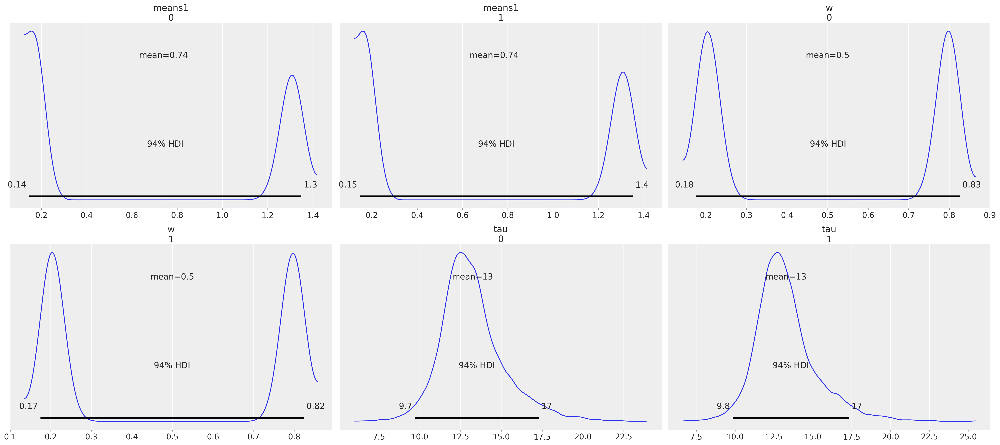

In [41]:
posterior_k2_set1 = trace_k2_set1.posterior
az.plot_posterior(trace_k2_set1)

In [33]:
#prior set 2, changing b
k=2
mu=[0., 1]
b=1e-1
c=0.5
d=0.5

with pm.Model() as mixture2_set2:
    w = pm.Dirichlet('w', a=np.ones(k))
    means = pm.Normal('means1', mu=mu, tau=b, shape=(k,))
    tau = pm.Gamma('tau', alpha=c, beta=d, shape=(k,))
    components = pm.Normal.dist(mu=means, tau=tau, shape=(k,))
    
    y = pm.Mixture('y', w=w, comp_dists=components, observed=radii_all)
    
    trace_k2_set2 = pm.sample(5000, chains=2, cores=4, init='jitter+adapt_diag', return_inferencedata=True)

az.summary(trace_k2_set2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [w, means1, tau]


Sampling 2 chains for 1_000 tune and 5_000 draw iterations (2_000 + 10_000 draws total) took 6 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
means1[0],0.173,0.015,0.146,0.203,0.000,0.000,8883.0,8034.0,1.0
means1[1],1.307,0.033,1.244,1.366,0.000,0.000,7613.0,7394.0,1.0
w[0],0.796,0.019,0.759,0.832,0.000,0.000,9443.0,7711.0,1.0
w[1],0.204,0.019,0.168,0.241,0.000,0.000,9443.0,7711.0,1.0
tau[0],12.696,1.033,10.719,14.614,0.011,0.008,8415.0,8461.0,1.0
tau[1],13.846,2.498,9.521,18.734,0.027,0.019,8165.0,6926.0,1.0


array([[<AxesSubplot:title={'center':'means1\n0'}>,
        <AxesSubplot:title={'center':'means1\n1'}>,
        <AxesSubplot:title={'center':'w\n0'}>],
       [<AxesSubplot:title={'center':'w\n1'}>,
        <AxesSubplot:title={'center':'tau\n0'}>,
        <AxesSubplot:title={'center':'tau\n1'}>]], dtype=object)

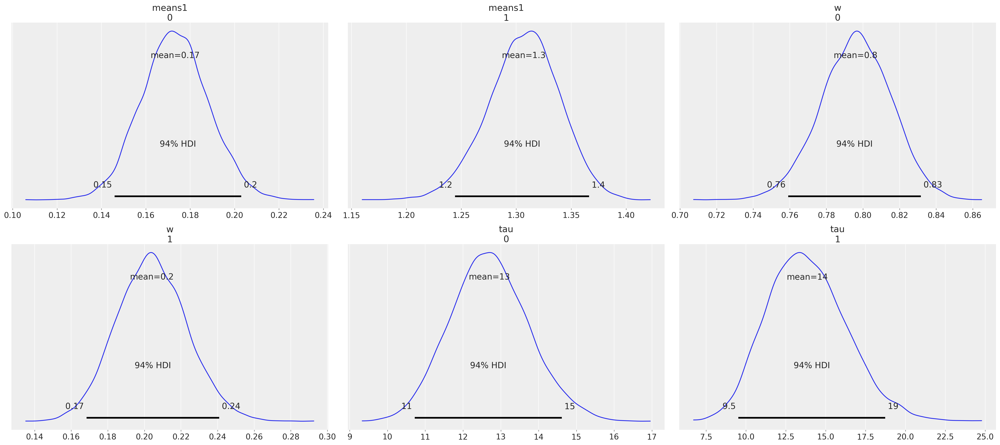

In [42]:
posterior_k2_set2 = trace_k2_set2.posterior
az.plot_posterior(trace_k2_set2)

In [34]:
#prior set 3, changing c and d
k=2
mu=[0., 1]
b=1e-3
c=1
d=1

with pm.Model() as mixture2_set3:
    w = pm.Dirichlet('w', a=np.ones(k))
    means = pm.Normal('means1', mu=mu, tau=b, shape=(k,))
    tau = pm.Gamma('tau', alpha=c, beta=d, shape=(k,))
    components = pm.Normal.dist(mu=means, tau=tau, shape=(k,))
    
    y = pm.Mixture('y', w=w, comp_dists=components, observed=radii_all)
    
    trace_k2_set3 = pm.sample(5000, chains=2, cores=4, init='jitter+adapt_diag', return_inferencedata=True)

az.summary(trace_k2_set3)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [w, means1, tau]


Sampling 2 chains for 1_000 tune and 5_000 draw iterations (2_000 + 10_000 draws total) took 6 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
means1[0],0.171,0.015,0.142,0.199,0.000,0.000,8343.0,7969.0,1.0
means1[1],1.297,0.037,1.224,1.362,0.000,0.000,6802.0,6104.0,1.0
w[0],0.793,0.020,0.756,0.831,0.000,0.000,7547.0,7565.0,1.0
w[1],0.207,0.020,0.169,0.244,0.000,0.000,7547.0,7565.0,1.0
tau[0],12.468,1.019,10.535,14.369,0.010,0.007,9666.0,8319.0,1.0
tau[1],11.631,2.121,7.780,15.635,0.024,0.017,7453.0,7115.0,1.0


array([[<AxesSubplot:title={'center':'means1\n0'}>,
        <AxesSubplot:title={'center':'means1\n1'}>,
        <AxesSubplot:title={'center':'w\n0'}>],
       [<AxesSubplot:title={'center':'w\n1'}>,
        <AxesSubplot:title={'center':'tau\n0'}>,
        <AxesSubplot:title={'center':'tau\n1'}>]], dtype=object)

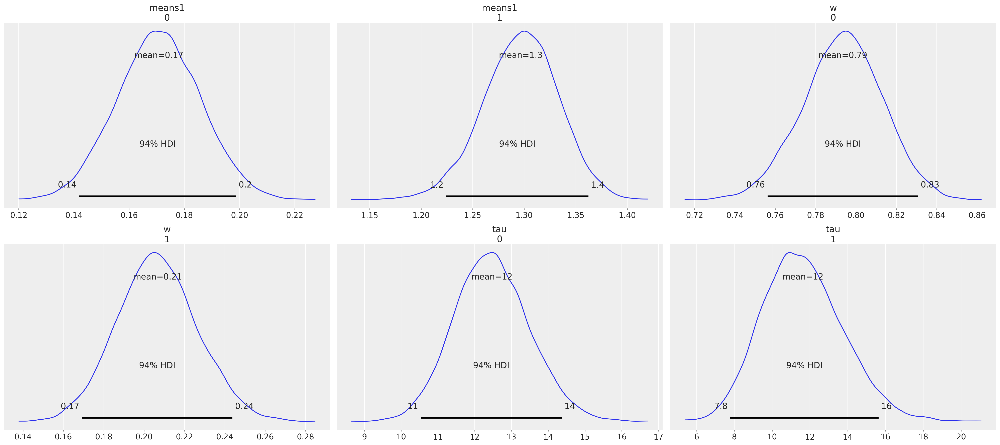

In [43]:
posterior_k2_set3 = trace_k2_set3.posterior
az.plot_posterior(trace_k2_set3)

In [35]:
#prior set 4, changing all of them
k=2
mu=[0.6, 1.8]
b=1e-1
c=1
d=1

with pm.Model() as mixture2_set4:
    w = pm.Dirichlet('w', a=np.ones(k))
    means = pm.Normal('means1', mu=mu, tau=b, shape=(k,))
    tau = pm.Gamma('tau', alpha=c, beta=d, shape=(k,))
    components = pm.Normal.dist(mu=means, tau=tau, shape=(k,))
    
    y = pm.Mixture('y', w=w, comp_dists=components, observed=radii_all)
    
    trace_k2_set4 = pm.sample(5000, chains=2, cores=4, init='jitter+adapt_diag', return_inferencedata=True)

az.summary(trace_k2_set4)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [w, means1, tau]


Sampling 2 chains for 1_000 tune and 5_000 draw iterations (2_000 + 10_000 draws total) took 6 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
means1[0],0.734,0.563,0.146,1.347,0.397,0.337,3.0,45.0,1.83
means1[1],0.734,0.564,0.142,1.344,0.398,0.337,3.0,42.0,1.83
w[0],0.500,0.294,0.176,0.821,0.207,0.175,3.0,47.0,1.83
w[1],0.500,0.294,0.179,0.824,0.207,0.175,3.0,47.0,1.83
tau[0],12.053,1.708,8.629,15.235,0.268,0.191,42.0,63.0,1.10
tau[1],12.054,1.736,8.289,15.007,0.279,0.199,39.0,45.0,1.11


array([[<AxesSubplot:title={'center':'means1\n0'}>,
        <AxesSubplot:title={'center':'means1\n1'}>,
        <AxesSubplot:title={'center':'w\n0'}>],
       [<AxesSubplot:title={'center':'w\n1'}>,
        <AxesSubplot:title={'center':'tau\n0'}>,
        <AxesSubplot:title={'center':'tau\n1'}>]], dtype=object)

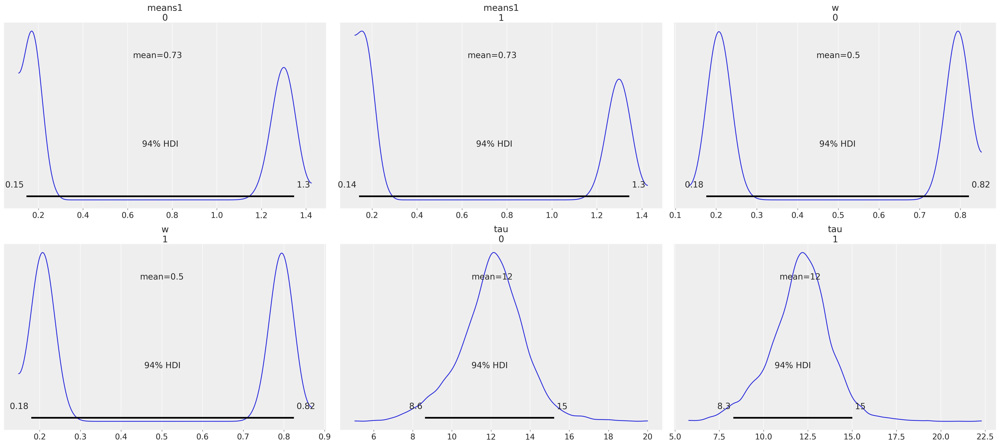

In [44]:
posterior_k2_set4 = trace_k2_set4.posterior
az.plot_posterior(trace_k2_set4)

array([[<AxesSubplot:title={'center':'means1\n0'}>,
        <AxesSubplot:title={'center':'means1\n1'}>,
        <AxesSubplot:title={'center':'w\n0'}>],
       [<AxesSubplot:title={'center':'w\n1'}>,
        <AxesSubplot:title={'center':'tau\n0'}>,
        <AxesSubplot:title={'center':'tau\n1'}>]], dtype=object)

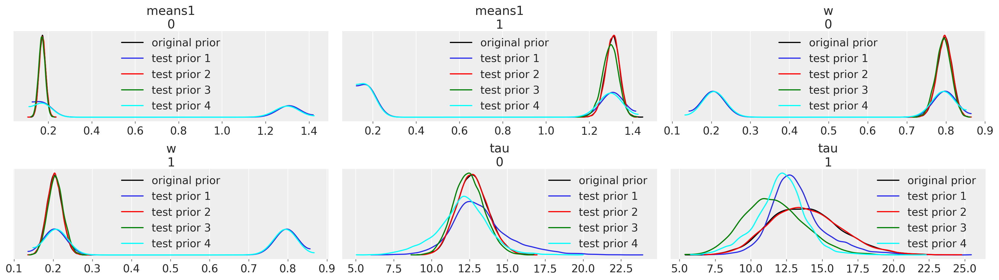

In [46]:
ax1 = az.plot_posterior(posterior_k2, color='black', hdi_prob='hide', point_estimate=None, label='original prior', figsize=(18,5))
az.plot_posterior(posterior_k2_set1, ax=ax1, hdi_prob='hide', point_estimate=None, label='test prior 1')
az.plot_posterior(posterior_k2_set2, ax=ax1, color='red', hdi_prob='hide', point_estimate=None, label='test prior 2')
az.plot_posterior(posterior_k2_set3, ax=ax1, color='green', hdi_prob='hide', point_estimate=None, label='test prior 3')
az.plot_posterior(posterior_k2_set4, ax=ax1, color='cyan', hdi_prob='hide', point_estimate=None, label='test prior 4')

array([<AxesSubplot:title={'center':'means1\n0'}>,
       <AxesSubplot:title={'center':'means1\n1'}>], dtype=object)

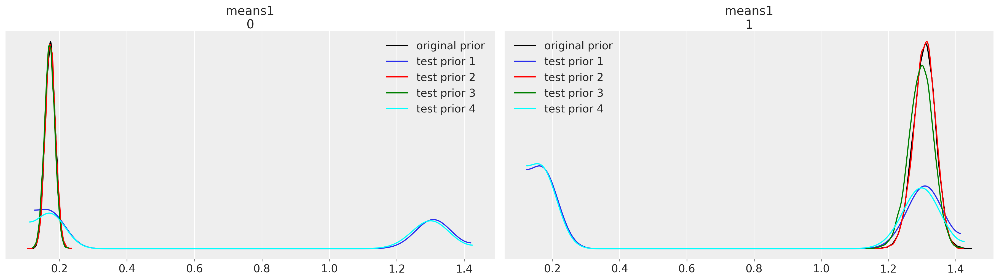

In [47]:
ax1 = az.plot_posterior(posterior_k2['means1'], color='black', hdi_prob='hide', point_estimate=None, label='original prior', figsize=(18,5))
az.plot_posterior(posterior_k2_set1['means1'], ax=ax1, hdi_prob='hide', point_estimate=None, label='test prior 1')
az.plot_posterior(posterior_k2_set2['means1'], ax=ax1, color='red', hdi_prob='hide', point_estimate=None, label='test prior 2')
az.plot_posterior(posterior_k2_set3['means1'], ax=ax1, color='green', hdi_prob='hide', point_estimate=None, label='test prior 3')
az.plot_posterior(posterior_k2_set4['means1'], ax=ax1, color='cyan', hdi_prob='hide', point_estimate=None, label='test prior 4')

array([<AxesSubplot:title={'center':'w\n0'}>,
       <AxesSubplot:title={'center':'w\n1'}>], dtype=object)

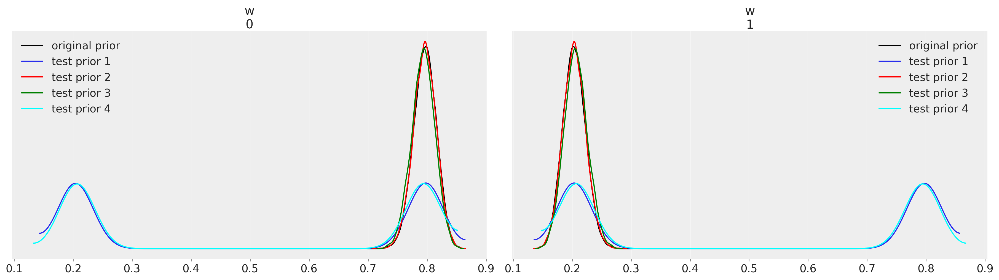

In [48]:
ax1 = az.plot_posterior(posterior_k2['w'], color='black', hdi_prob='hide', point_estimate=None, label='original prior', figsize=(18,5))
az.plot_posterior(posterior_k2_set1['w'], ax=ax1, hdi_prob='hide', point_estimate=None, label='test prior 1')
az.plot_posterior(posterior_k2_set2['w'], ax=ax1, color='red', hdi_prob='hide', point_estimate=None, label='test prior 2')
az.plot_posterior(posterior_k2_set3['w'], ax=ax1, color='green', hdi_prob='hide', point_estimate=None, label='test prior 3')
az.plot_posterior(posterior_k2_set4['w'], ax=ax1, color='cyan', hdi_prob='hide', point_estimate=None, label='test prior 4')

array([<AxesSubplot:title={'center':'tau\n0'}>,
       <AxesSubplot:title={'center':'tau\n1'}>], dtype=object)

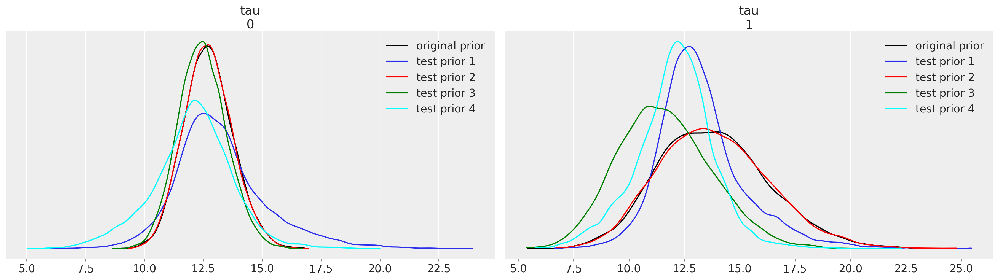

In [49]:
ax1 = az.plot_posterior(posterior_k2['tau'], color='black', hdi_prob='hide', point_estimate=None, label='original prior', figsize=(18,5))
az.plot_posterior(posterior_k2_set1['tau'], ax=ax1, hdi_prob='hide', point_estimate=None, label='test prior 1')
az.plot_posterior(posterior_k2_set2['tau'], ax=ax1, color='red', hdi_prob='hide', point_estimate=None, label='test prior 2')
az.plot_posterior(posterior_k2_set3['tau'], ax=ax1, color='green', hdi_prob='hide', point_estimate=None, label='test prior 3')
az.plot_posterior(posterior_k2_set4['tau'], ax=ax1, color='cyan', hdi_prob='hide', point_estimate=None, label='test prior 4')